# Shapes, Rasters, and Classifications 

### By Aviv Elbag, Otto Wagner, and Analytical Mechanics Associates

Full Map

In [3]:
import folium
import os
import geopandas as gpd
one = gpd.GeoDataFrame()
mapa = folium.Map([2.18, -73.78], zoom_start=13,tiles='Stamen Terrain')
for file in os.listdir():
    if file.endswith(".shp"):
        One = gpd.read_file(file)
        print(One)
        one = one.append(One)
        try:
            folium.GeoJson(One).add_to(mapa)
        except:
            continue
mapa

     Id           Dec                                           geometry
0   311  Bosque Denso  POLYGON ((600791.862315396 224411.5441881643, ...
1   311  Bosque Denso  POLYGON ((594831.3170609723 225407.173262754, ...
2   311  Bosque Denso  POLYGON ((605668.3969017974 236027.8658374744,...
3   311  Bosque Denso  POLYGON ((630482.8706974151 215230.230158867, ...
4   311  Bosque Denso  POLYGON ((652046.4554912536 212154.442757292, ...
5   311  Bosque Denso  POLYGON ((674602.2297694717 196114.0460931634,...
6   311  Bosque Denso  POLYGON ((670071.2311241413 217776.8498354384,...
7   311  Bosque Denso  POLYGON ((677248.0683944817 230840.6780464304,...
8   311  Bosque Denso  POLYGON ((686541.5765648327 240200.3321824049,...
9   311  Bosque Denso  POLYGON ((648904.5221240527 173991.5278897947,...
10  311  Bosque Denso  POLYGON ((680337.0849891824 159386.498679732, ...
11  311  Bosque Denso  POLYGON ((630330.7349764763 151607.7331222026,...
12  311  Bosque Denso  POLYGON ((610963.1962413997 

The raster methods

In [20]:
for elem in one.geometry:
    A = elem
    break

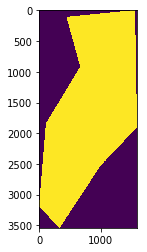

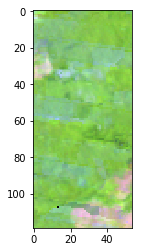

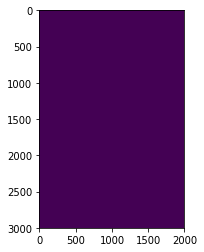

In [21]:
from rasterio import transform
import geopandas as gpd
from pyproj import Proj
from pyproj import transform as coTran
import datacube
import numpy as np
from shapely.geometry import shape
import matplotlib.pyplot as plt
from rasterio.features import rasterize
from scipy.misc import imresize


T = transform.from_origin(634000,242000,1,1)
b = shape({
    'type': 'Polygon',
'coordinates': [[(2, 2), (2, 90), (90, 90), (4.25, 2), (2, 2)]]})
dc = datacube.Datacube(app    = "my_random_app",
                       config = "/home/localuser/.datacube.conf")

def is_l7_dataset_clean(dataset):    
    clear_pixels = dataset.pixel_qa.values == 2 + 64
    water_pixels = dataset.pixel_qa.values == 4 + 64
    a_clean_mask = np.logical_or(clear_pixels, water_pixels)
    return a_clean_mask

def composite(ds):
    ds = ds.where(is_l7_dataset_clean(ds))
    return ds.median(dim='time', skipna=True, keep_attrs=False)


def rasterize_and_separate(Geometries,transform= None, prev_Map = None,data_label = []):
    if prev_Map == None:
        prev_Map = np.zeros((3000,2000))
    for i,geom in enumerate(Geometries.geometry):
        if len(data_label) == 0:
            new_Map = rasterize([geom], out_shape = prev_Map.shape,default_value = i+1,transform=transform)
        else:
            new_Map = rasterize([geom], out_shape = prev_Map.shape,default_value = data_label.values[i],transform=transform)
            
        prev_Map+=new_Map
    return prev_Map

def binary_rasterize(Data,
                     data_label=None,
                     data_value=None,
                     prev_Map = None,
                     size= None):
    """
    This function has two modes. It has one mode where you just input the geometry and will 
    rasterize the data into true and false. In the bounding box of the geometry. 
    The other mode takes a Dataframe a data label a data value and returns all geometries in
    raster form that were of that data value.
    Geometries:
    data_label:
    data_value:
    transform:
    prev_Map:
    size:
    
    Output:
    """
    if prev_Map == None: #Even if size is defined we don't want to use it if the map is defined
        if type(Data) is not type(b):  # could be optimized
            MinX,MinY,MaxX,MaxY = (min(Data.geometry.bounds['minx']),min(Data.geometry.bounds['miny'])
                                   ,max(Data.geometry.bounds['maxx']),max(Data.geometry.bounds['maxy']))
        else:
            MinX,MinY,MaxX,MaxY = Data.bounds
        if size == None:     
            prev_Map = np.zeros((int(MaxY-MinY),int(MaxX-MinX)))
        else:
            prev_Map = np.zeros(size)
        
    else:
        prev_Map = prev_Map
        
    if type(Data) != type(b):
        DataGeom= Data[Data[data_label]==data_value]
        for geom in DataGeom.geometry:
            minx,miny,maxx,maxy = geom.bounds
            T = transform.from_origin(minx,maxy,1,1)
            new_Map = rasterize([geom], out_shape = prev_Map.shape
                                ,default_value = 1,transform=T)
            prev_Map+=new_Map
        try:
            print('good')
            Minx,Miny = np.where( new_Map==np.min(new_Map[np.nonzero(new_Map)]))
            Maxx,Maxy = np.where( new_Map==np.max(new_Map[np.nonzero(new_Map)]))
            Minx= min(Minx)
            Maxx = max(Maxx)
            Miny= min(Miny)
            Maxy = max(Maxy)
            new_Map=new_Map[Minx:Maxx,Miny:Maxy]
            return new_Map,minx,miny,maxx,maxy
        except:
            print("It seems that your label doesn't have any elements... Or there is a bug. ")
    
    else:
        minx,miny,maxx,maxy = Data.bounds
        T = transform.from_origin(minx,maxy,1,1)
        new_Map = rasterize([Data], out_shape = prev_Map.shape
                            ,default_value = 1,transform=T)
        prev_Map+=new_Map
        return new_Map,minx,miny,maxx,maxy

def get_map(xmin,
            xmax,
            ymin,
            ymax,
            product = "ls7_ledaps_sanagustin",
            coordinate_system = 'epsg:4326',time = None,
            measurements = ['red', 'green', 'blue', 'nir', 'swir1', 'swir2', 'pixel_qa']):
    
    dc = datacube.Datacube(app    = "my_random_app",
                       config = "/home/localuser/.datacube.conf")

#     xmin = coordinates[0]
#     xmax = coordinates[0]+size[0]
#     ymin = coordinates[1]
#     ymax = coordinates[1]+size[1]
    
    
#     projFrom = Proj(init = coordinate_system)     #The coordinate system used in the data
#     projTo = Proj(init = 'epsg:4326')    #WGS84

#     lonmin,latmin= coTran(projFrom,projTo,xmin,ymin)   #transform from epsg:... to WGS84

#     lonmax,latmax= coTran(projFrom,projTo,xmax,ymax)

#     latmean = np.average([latmin,latmax])
#     lonmean = np.average([lonmin,lonmax])
    dataset = dc.load( product = product,x = (xmin, xmax),y = (ymin, ymax),crs = coordinate_system,measurements = measurements,  time = ('2012-01-01', '2015-01-01')) 


    median_dataset = composite(dataset)
    img = np.dstack((median_dataset.swir1.values/np.nanmax(median_dataset.swir1.values),median_dataset.nir.values/np.nanmax(median_dataset.nir.values),median_dataset.red.values/np.nanmax(median_dataset.red.values)))
    img = np.nan_to_num(img,0)
    return img
    

def clip(truth,img2):
    imga= imresize(truth,img2.shape)
    imgf = np.einsum('ijk,ij-> ijk',img2,imga)
    return imga,imgf
          
def clip_from_shape(shape):
    img,minx1,maxx1,miny1,maxy1= binary_rasterize(shape)
    img2 = get_map(minx1,miny1,maxx1,maxy1,coordinate_system='EPSG:32618')
    img1,imgClipped= clip(img,img2)
    return (img,img1,img2,imgClipped)
    
    
#plt.imshow(get_map((643000,200000),coordinate_system='EPSG:32618'))  
img,minx1,maxx1,miny1,maxy1= binary_rasterize(A)

plt.imshow(img)
plt.show()
# img2 = get_map((minx1,miny1),size = (maxx1-minx1,maxy1-miny1),coordinate_system='EPSG:32618')
img2 = get_map(minx1,miny1,maxx1,maxy1,coordinate_system='EPSG:32618')
plt.imshow(img2)
plt.show()
        #     if prev_Map == None:
#         try:
#             prev_Map = n 
plt.imshow(rasterize_and_separate(One,transform = T))


Read a shape composed of multiple polygons

In [17]:
One

,Id,Des,geometry
0,111,Tejido Urbano Continuo,"POLYGON ((635557.74156385 241568.3330409525, 6..."
1,112,Tejido Urbano Discontinuo,"POLYGON ((634469.0095568664 241596.4198605165,..."
2,124,Aeropuertos,"POLYGON ((634932.5035807797 240889.3279772605,..."


In [16]:
One = gpd.read_file('1.shp')

Make a geometry object to look at

In [6]:
for elem in One.geometry:
    A = elem
    break

Examples of raster methods

In [7]:
One

,Id,Des,geometry
0,111,Tejido Urbano Continuo,"POLYGON ((635557.74156385 241568.3330409525, 6..."
1,112,Tejido Urbano Discontinuo,"POLYGON ((634469.0095568664 241596.4198605165,..."
2,124,Aeropuertos,"POLYGON ((634932.5035807797 240889.3279772605,..."


/home/localuser/Datacube/datacube_env/lib/python3.5/site-packages/scipy/misc/pilutil.py:482: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if issubdtype(ts, int):
/home/localuser/Datacube/datacube_env/lib/python3.5/site-packages/scipy/misc/pilutil.py:485: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif issubdtype(type(size), float):


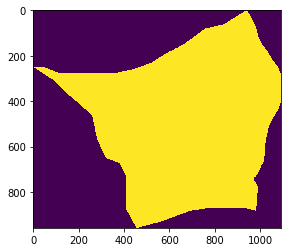

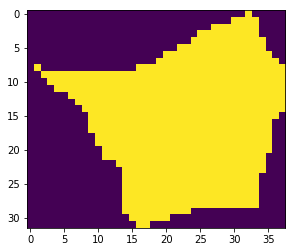

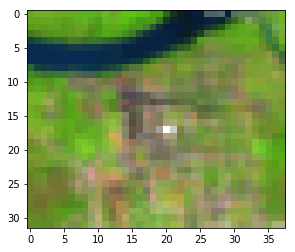

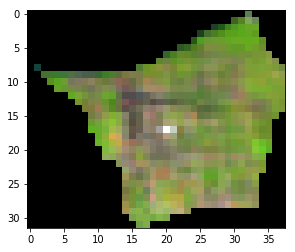

In [8]:
#One = gpd.read_file('1.shp')    #A whole GeoDataFrame
#img,minx1,maxx1,miny1,maxy1= binary_rasterize(One,data_label='Id',data_value=111)

#img,minx1,maxx1,miny1,maxy1= binary_rasterize(A)  #Just a shape file
[img,img1,img2,imgClipped] = clip_from_shape(A)
plt.imshow(img)
plt.show()
plt.imshow(img1)
plt.show()
# img2 = get_map((minx1,miny1),size = (maxx1-minx1,maxy1-miny1),coordinate_system='EPSG:32618')
#img2 = get_map(minx1,miny1,maxx1,maxy1,coordinate_system='EPSG:32618')
plt.imshow(img2)
plt.show()
plt.imshow(imgClipped);

random forest

In [9]:
from sklearn.ensemble import RandomForestClassifier as RF
from sklearn.cluster import KMeans
from scipy.signal import convolve2d,convolve
import numpy as np
import matplotlib.pyplot as plt
import os
import pickle

#This is for elegance. The warnings should eventually be heeded.
import warnings
warnings.filterwarnings("ignore")

class Columbia_Forest_Predictor:
    
    def __init__(self,mode='auto',filename = None):
        dc = datacube.Datacube(app    = "my_random_app",
                       config = "/home/localuser/.datacube.conf")
        #changing these parameters leads to over/under fitting.
        self.clf = RF(max_depth=10,n_estimators=30, random_state=0,warm_start=True)
        
        if mode == 'auto': 
            dataset,img,labels = self.plot_and_retrieve()
        
        elif mode == 'load':
            try:
                self.clf = pickle.load(open(filename, 'rb'))
            except:
                raise('No such file exists.')
                
            
        elif mode == 'shape_folder':
            done = False
            self.DataFrame = gpd.GeoDataFrame()
            
            while not done: 
                try:
                    folder = input('what is the folder name?')
                    files = self.read_folder(folder)
                    
                    for elem in files:
                        print(elem)
                        
                    done = input("Is this correct?(\'Y\' = Yes, \'N\' = No)")
                    
                    if done == 'Y':
                        done = True
                    elif done == 'N':
                        done = False
                        
                except:
                    print('not a valid folder.')
            #Yes this is clunky
            if folder == '.':
                folder = ''
                
            self.read_shapes(files)
            
            print(self.DataFrame.keys())
            
            Interest = input('What is our variable of interest?')
            print('The set of all such variable values is:\n')
            print(set(self.DataFrame[Interest]),'\n')
            
            done = False
            
            print('which of these do you want to include in the classification?\n')
            
            self.good_vals = []
            
            while not done:
                a = input()
                
                if a == 'Done':
                    done = True 
                    break
                    
                print('You want to include %s?(\'Y\' = Yes, \'N\' = No,\'Done\' = Done)'%str(a))
                
                check = input()
                
                if check == 'Y':
                    self.good_vals.append(int(a))
            while True:
                print('Do you want  to see the pictures as they are trained?(Y = Yes, N = No)')        
                check = input()
                if check == 'Y':
                    pictures = True
                    break
                elif check == 'N':
                    pictures = False
                    break
            
            print('making list of all shapes...')
            
            self.goodShapes = {}
            self.keychain = {}
            
            for i,good_val in enumerate(self.good_vals):
                self.keychain[good_val] = i+1
                self.goodShapes[good_val] =self.DataFrame[self.DataFrame[Interest] == good_val].geometry
                
            print('Done!')
            print('List of all relevant areas:')
            print(self.goodShapes)
            print('Training...')
            imgClippedTot = np.array([])
            LabelMatTot = np.array([])
            for Label in self.goodShapes:
                shapes = self.goodShapes[Label]
                for shape in shapes:
                    if shape == None:
                        continue
                    [_,LabelMat,_,imgClipped] = clip_from_shape(shape)
                    #if you want to display the pictures
                    if pictures:
                        plt.imshow(imgClipped)
                        plt.show()
                        plt.imshow(LabelMat)
                        plt.show()
                    else: #this is to be a progress bar
                        pass
                    LabelMat = LabelMat*self.keychain[Label]
                    #Below is not efficient. 
                    imgClippedTot = np.append(imgClippedTot, imgClipped.flatten())
                    LabelMatTot = np.append(LabelMatTot,LabelMat.flatten())
            #print(LabelMatTot)
            #print(imgClippedTot)
            self.train_forest(imgClippedTot,LabelMatTot)
            print('Done!')
            
            
            
                
        #self.clf = RF(max_depth=4, random_state=0)
        #self.clf = train_forest(img,labels)
        
    def read_folder(self,folder):
        all_files = os.listdir(folder)
        shp_files = []
        for file in all_files:
            if file.endswith(".shp"):
                shp_files.append(os.path.join(os.getcwd()+'/'+folder+'/', file))
        return shp_files
    
#     def train_forest_shapes(self,data_label,data_value):
#         polys = self.shapes[self.shapes[data_label]==data_value]
#         for elem in polys:
            
    
    def read_shapes(self,files):
        print('reading files.')
        for file in files:
            self.DataFrame =self.DataFrame.append(gpd.read_file(file))
        print('done reading files')
            
    def is_l7_dataset_clean(dataset):    
        clear_pixels = dataset.pixel_qa.values == 2 + 64
        water_pixels = dataset.pixel_qa.values == 4 + 64
        a_clean_mask = np.logical_or(clear_pixels, water_pixels)
        return a_clean_mask
    
    def composite(ds):
        ds = ds.where(is_l7_dataset_clean(ds))
        return ds.median(dim='time', skipna=True, keep_attrs=False)

    def pull_Median(self,dataset):
        median_dataset = composite(dataset)
        img = np.dstack((median_dataset.swir1.values/np.nanmax(median_dataset.swir1.values),median_dataset.nir.values/np.nanmax(median_dataset.nir.values),median_dataset.red.values/np.nanmax(median_dataset.red.values)))
        img = np.nan_to_num(img,-999)
        return img

    def make_Labels(self,img,n_clusters=5,style = 'KMeans'):
        a2 = np.ones((3,3))
        img = np.nan_to_num(img,-1)
        img_swir = convolve(a2,img[:,:,0])
        img_nir = convolve(a2,img[:,:,1])
        img_grn = convolve(a2,img[:,:,2])
        img2 = np.dstack((img_swir/np.max(img_swir),img_nir/np.max(img_nir),img_grn/np.max(img_grn)))
        img2_flat = img2.reshape(-1,3)   
        if style == 'KMeans':
            classifier3 = KMeans(n_clusters=3).fit(img2_flat)
        else:
            print('different')
            classifier3 = self.clf
        labels = classifier3.predict(img2_flat).reshape(img2.shape[:2])
        labels = np.nan_to_num(labels,-999)
        return img2,labels
    # import sys

    def plot_and_retrieve(self,x=(1.65,1.73),y=(-73.7,-73.4),crs = 'EPSG:4326', plot = True,time =('2012-01-01', '2015-01-01'), falseColor = ["FIX THIS LATER"],style= 'KMeans'):
        print('loading data!')
        dataset = dc.load( product = "ls7_ledaps_sanagustin",latitude = x,longitude = y,crs = crs,measurements = ['red', 'green', 'blue', 'nir', 'swir1', 'swir2', 'pixel_qa'],time = time)
        print('Done Loading data')
        if plot == True:

    #         if "matplotlib.pyplot" not in sys.modules:

    #             print("matplotlib not imported... Importing.")

    #             import matplotlib.pyplot as plt

    #             print('Done importing.')
            print('Beginning plotting') 
            for index in range(len(dataset.time)):  
                img = np.dstack((dataset.where(dataset > 0).isel(time = index).swir1.values/np.nanmax(dataset.where(dataset > 0).isel(time = index).swir1.values),dataset.where(dataset > 0).isel(time = index).nir.values/np.nanmax(dataset.where(dataset > 0).isel(time = index).nir.values),dataset.where(dataset > 0).isel(time = index).red.values/np.nanmax(dataset.where(dataset > 0).isel(time = index).red.values)))
                plt.figure(figsize=(12,4))
                plt.title(dataset.time[index].values)
                plt.imshow(img)
                plt.show()
            finim = self.pull_Median(dataset)
            plt.figure(figsize=(12,4))
            plt.title("Composite Image")
            plt.imshow(finim)
            plt.show()
            finim,labels = self.make_Labels(finim,style = style)
            plt.figure(figsize=(12,4))
            plt.title("Labels")
            plt.imshow(labels)
            plt.show()
            return dataset,finim,labels
        return dataset
    
    def train_forest(self,img,labels):
        #clf = RF(max_depth=4, random_state=0)   #Make the Random Forest
        img = np.array(img)
        labels = np.array(labels)
        labels_Flat = labels.flatten()
        img_Flat =img.reshape(-1,3)
#         k=0
#         for i in img_Flat.flatten():
#             if np.isnan(i):
#                 k+=1
#         print(k)
        #print(img_Flat)
        #print(labels_Flat)
        self.clf.fit(img_Flat,labels_Flat)

    def predict(self,img,plot =True):
        labels = self.clf.predict(img.reshape(-1,3))
        labels = labels.reshape(img.shape[0:2])
        if plot == True:
            plt.figure(figsize=(12,4))
            plt.imshow(img)
            plt.show()
            plt.figure(figsize=(12,4))
            print(labels.shape)
            plt.imshow(labels)
            plt.show()
        return labels

    def save_classifier(self,filename):
        pickle.dump(self.clf, open(filename, 'wb'))
        

Sample random forest

In [9]:
one

,Dec,Des,Id,geometry
0,Bosque Denso,NaN,311,"POLYGON ((600791.862315396 224411.5441881643, ..."
1,Bosque Denso,NaN,311,"POLYGON ((594831.3170609723 225407.173262754, ..."
2,Bosque Denso,NaN,311,"POLYGON ((605668.3969017974 236027.8658374744,..."
3,Bosque Denso,NaN,311,"POLYGON ((630482.8706974151 215230.230158867, ..."
4,Bosque Denso,NaN,311,"POLYGON ((652046.4554912536 212154.442757292, ..."
5,Bosque Denso,NaN,311,"POLYGON ((674602.2297694717 196114.0460931634,..."
6,Bosque Denso,NaN,311,"POLYGON ((670071.2311241413 217776.8498354384,..."
7,Bosque Denso,NaN,311,"POLYGON ((677248.0683944817 230840.6780464304,..."
8,Bosque Denso,NaN,311,"POLYGON ((686541.5765648327 240200.3321824049,..."
9,Bosque Denso,NaN,311,"POLYGON ((648904.5221240527 173991.5278897947,..."


/home/local/AMA-INC/amelbag/aviv_notebook_server/entrenamiento/./311.shp
/home/local/AMA-INC/amelbag/aviv_notebook_server/entrenamiento/./323.shp
/home/local/AMA-INC/amelbag/aviv_notebook_server/entrenamiento/./32.shp
/home/local/AMA-INC/amelbag/aviv_notebook_server/entrenamiento/./2.shp
/home/local/AMA-INC/amelbag/aviv_notebook_server/entrenamiento/./4.shp
/home/local/AMA-INC/amelbag/aviv_notebook_server/entrenamiento/./1.shp
/home/local/AMA-INC/amelbag/aviv_notebook_server/entrenamiento/./314.shp
reading files.
done reading files
Index(['Dec', 'Des', 'Id', 'geometry'], dtype='object')
The set of all such variable values is:

{32, 323, 231, 233, 111, 112, 311, 314, 124, 511} 

which of these do you want to include in the classification?

You want to include 511?('Y' = Yes, 'N' = No,'Done' = Done)
You want to include 314?('Y' = Yes, 'N' = No,'Done' = Done)
You want to include 311?('Y' = Yes, 'N' = No,'Done' = Done)
You want to include 233?('Y' = Yes, 'N' = No,'Done' = Done)
You want to

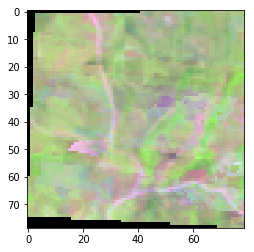

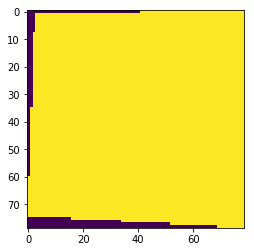

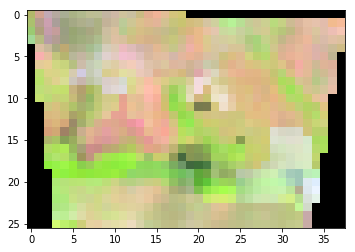

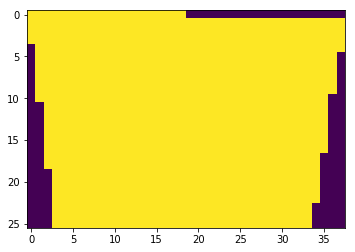

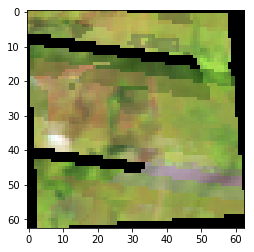

...

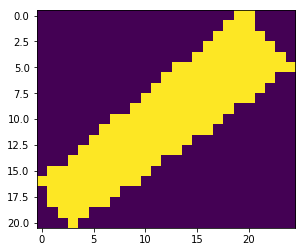

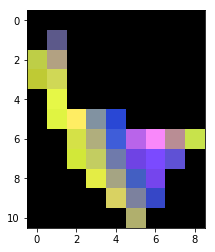

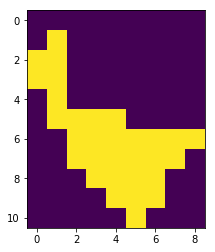

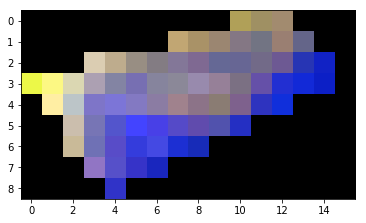

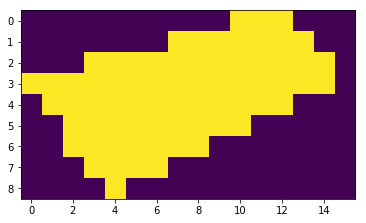

Done!


In [23]:
C = Columbia_Forest_Predictor(mode ='shape_folder')

Random Forest with Shapes

In [10]:
_,_,labs= C.plot_and_retrieve(style ='asdfasd')

NameError: name 'C' is not defined

In [10]:
set(labs.flatten())

{0.0, 1.0, 2.0, 3.0}

In [11]:
C.save_classifier('river_and_two_forests')

In [11]:
B = Columbia_Forest_Predictor(mode = 'load',filename = 'river_and_two_forests')

loading data!
Done Loading data
Beginning plotting


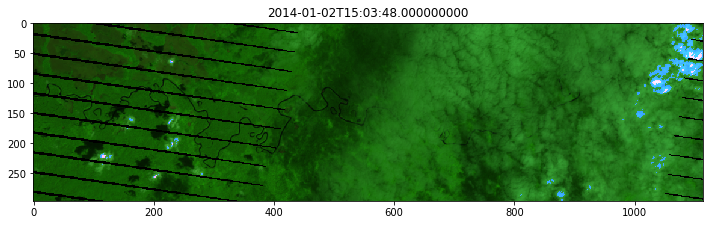

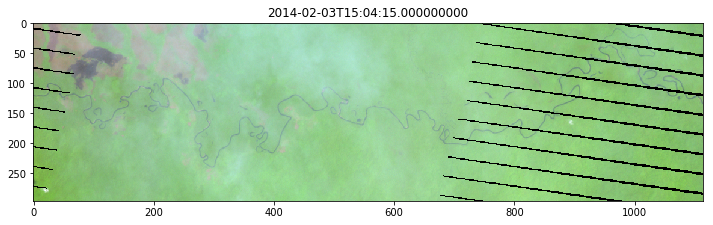

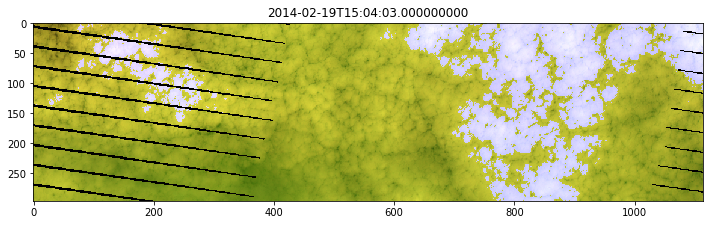

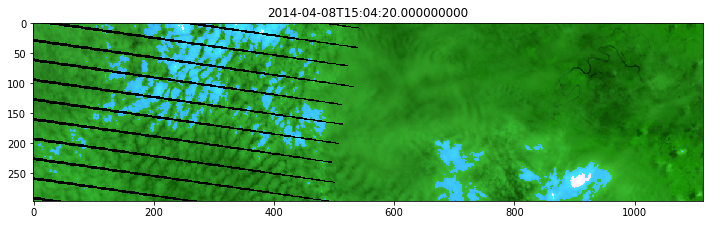

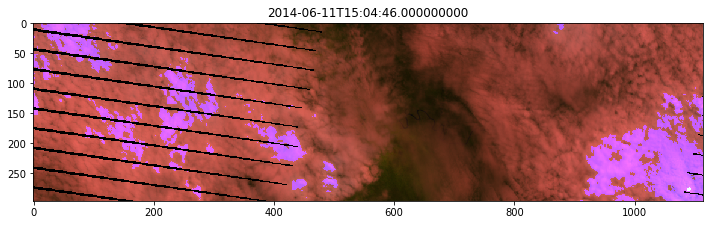

...

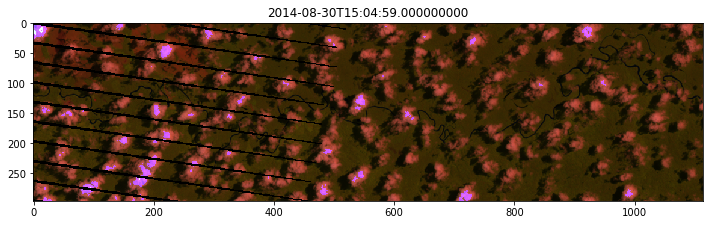

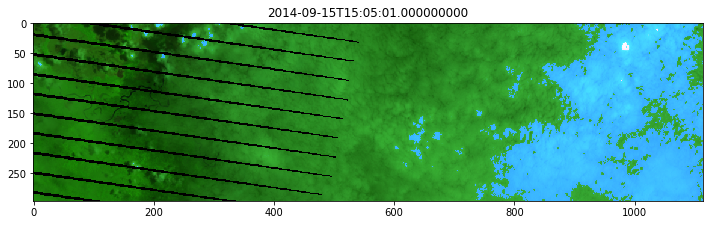

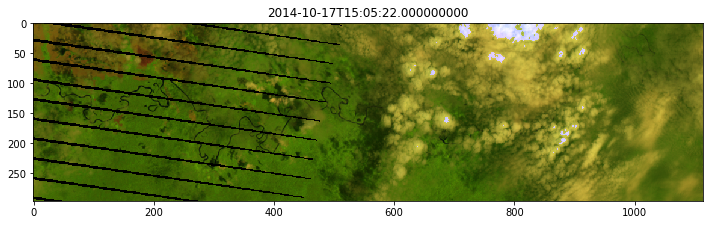

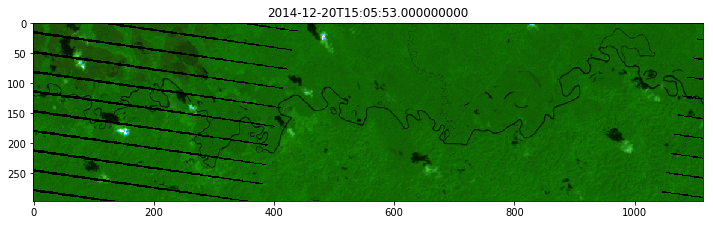

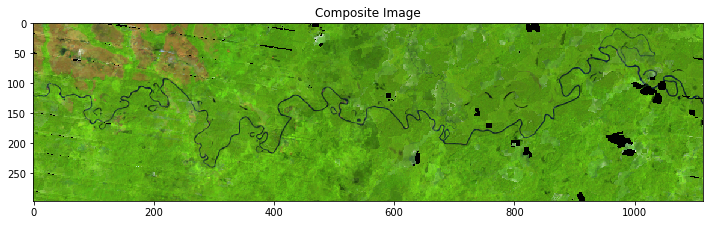

different


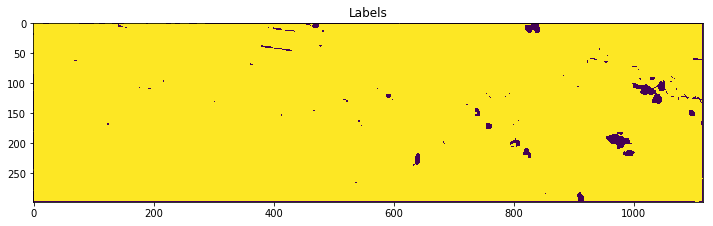

(<xarray.Dataset>
 Dimensions:    (latitude: 296, longitude: 1114, time: 10)
 Coordinates:
   * time       (time) datetime64[ns] 2014-01-02T15:03:48 2014-02-03T15:04:15 ...
   * latitude   (latitude) float64 1.73 1.73 1.729 1.729 1.729 1.729 1.728 ...
   * longitude  (longitude) float64 -73.7 -73.7 -73.7 -73.7 -73.7 -73.7 -73.7 ...
 Data variables:
     red        (time, latitude, longitude) int16 660 659 568 622 584 583 565 ...
     green      (time, latitude, longitude) int16 628 627 626 625 564 522 541 ...
     blue       (time, latitude, longitude) int16 382 399 415 377 338 337 354 ...
     nir        (time, latitude, longitude) int16 2387 2428 2310 2351 2153 ...
     swir1      (time, latitude, longitude) int16 2206 2135 2064 2064 2065 ...
     swir2      (time, latitude, longitude) int16 1050 950 899 950 975 975 ...
     pixel_qa   (time, latitude, longitude) int32 66 66 66 66 66 66 66 66 66 ...
 Attributes:
     crs:      EPSG:4326, array([[[0.07681634, 0.06577489, 0.0397379 ],


In [12]:
B.plot_and_retrieve(style= 'not-KMeans')

## Make the training and the testing sets

In [13]:
#to get a test and training set from the data
def make_training_and_test_data(folder,proportion = .5):
    #Do this later



def shape_subset(shape_file,to_file1,to_file2,proportion = .5):
    data = gpd.read_file(shape_file)
    data[:int(len(data)*proportion)].to_file(to_file1)
    data[:int(len(data)*proportion)].to_file(to_file2)

IndentationError: expected an indented block (<ipython-input-13-97f8657076b1>, line 7)

In [14]:
shape_subset('4.shp','train//train_4.shp','test//test_4.shp')

NameError: name 'shape_subset' is not defined

In [15]:
C.keychain

NameError: name 'C' is not defined

what is the folder name?
not a valid folder.
what is the folder name?.
/home/local/AMA-INC/amelbag/aviv_notebook_server/entrenamiento/./311.shp
/home/local/AMA-INC/amelbag/aviv_notebook_server/entrenamiento/./323.shp
/home/local/AMA-INC/amelbag/aviv_notebook_server/entrenamiento/./32.shp
/home/local/AMA-INC/amelbag/aviv_notebook_server/entrenamiento/./2.shp
/home/local/AMA-INC/amelbag/aviv_notebook_server/entrenamiento/./4.shp
/home/local/AMA-INC/amelbag/aviv_notebook_server/entrenamiento/./1.shp
/home/local/AMA-INC/amelbag/aviv_notebook_server/entrenamiento/./314.shp
Is this correct?('Y' = Yes, 'N' = No)Y
reading files.
done reading files
Index(['Dec', 'Des', 'Id', 'geometry'], dtype='object')
What is our variable of interest?Id
The set of all such variable values is:

{32, 323, 231, 233, 111, 112, 311, 314, 124, 511} 

which of these do you want to include in the classification?

511
You want to include 511?('Y' = Yes, 'N' = No,'Done' = Done)
Y
Done
Do you want  to see the pictures a

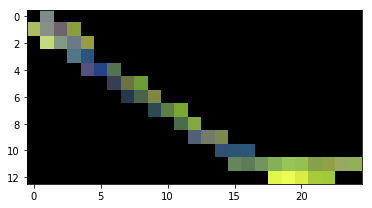

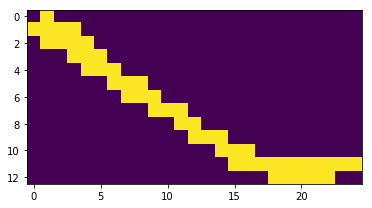

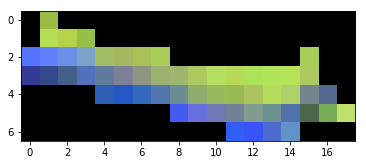

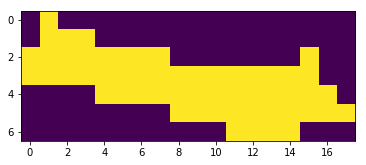

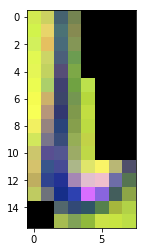

...

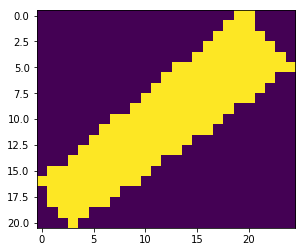

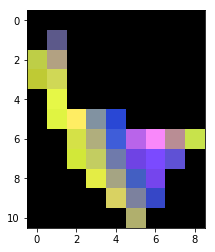

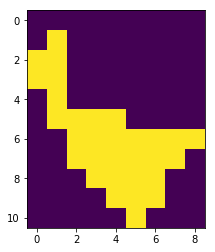

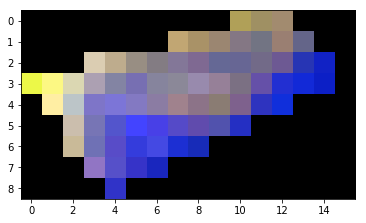

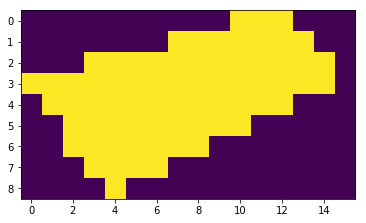

Done!


In [16]:
C = Columbia_Forest_Predictor(mode ='shape_folder')

loading data!
Done Loading data
Beginning plotting


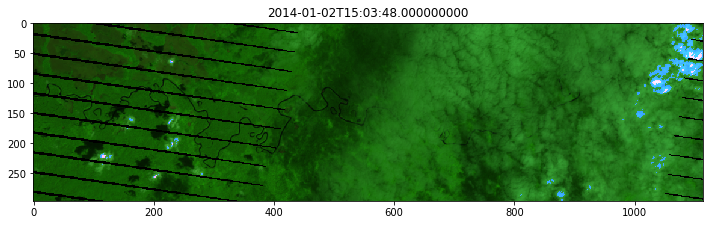

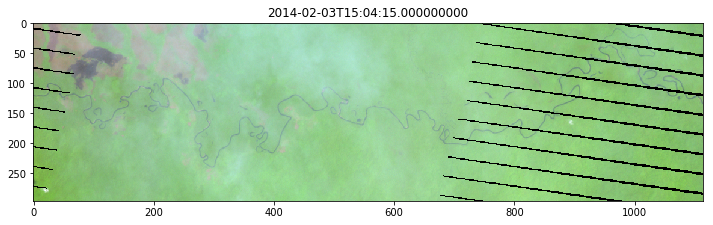

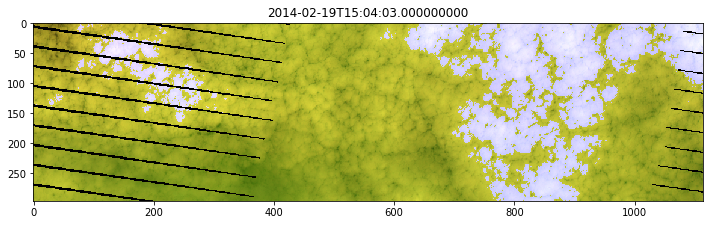

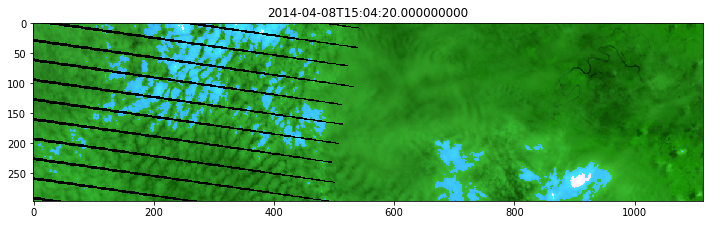

Exception ignored in: <bound method Collection.__del__ of <open Collection '/home/local/AMA-INC/amelbag/aviv_notebook_server/entrenamiento/traint/train_2.shp:train_2', mode 'w' at 0x7f5ae3bd6208>>
Traceback (most recent call last):
  File "/home/localuser/Datacube/datacube_env/lib/python3.5/site-packages/fiona/collection.py", line 426, in __del__
    self.close()
  File "/home/localuser/Datacube/datacube_env/lib/python3.5/site-packages/fiona/collection.py", line 403, in close
    self.flush()
  File "/home/localuser/Datacube/datacube_env/lib/python3.5/site-packages/fiona/collection.py", line 394, in flush
    new_len = self.session.get_length()
  File "fiona/ogrext.pyx", line 480, in fiona.ogrext.Session.get_length
ValueError: Null layer


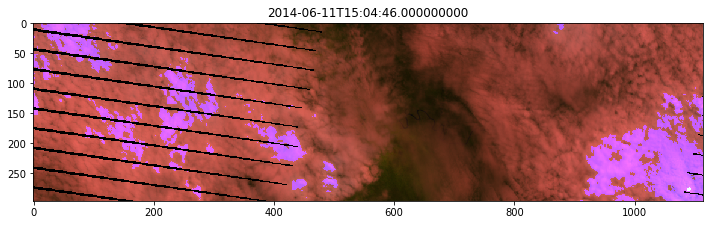

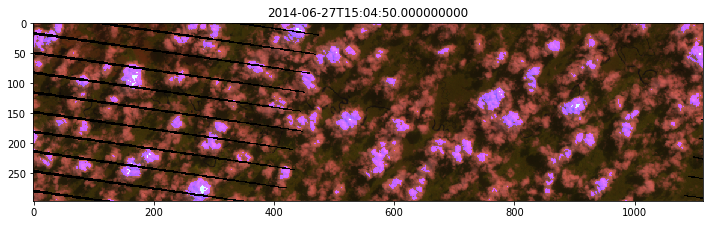

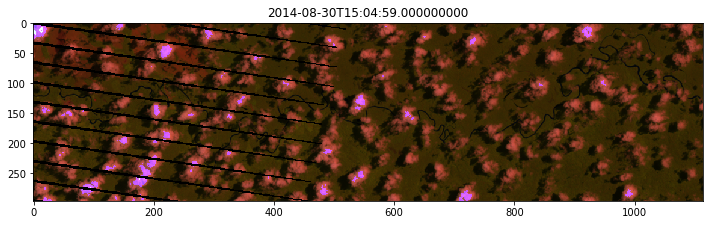

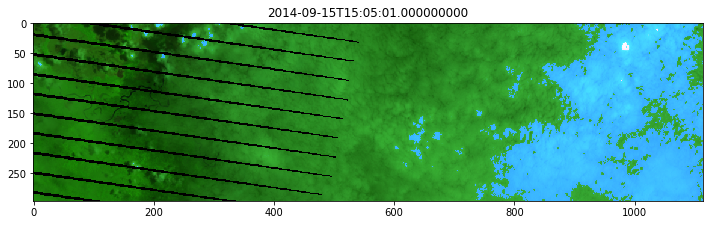

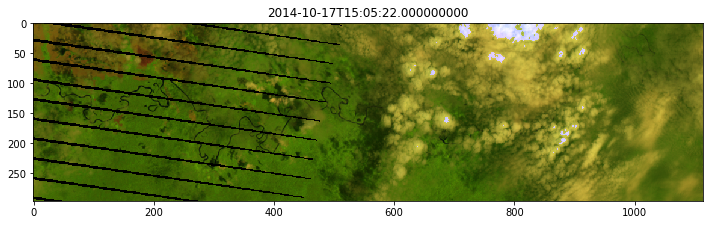

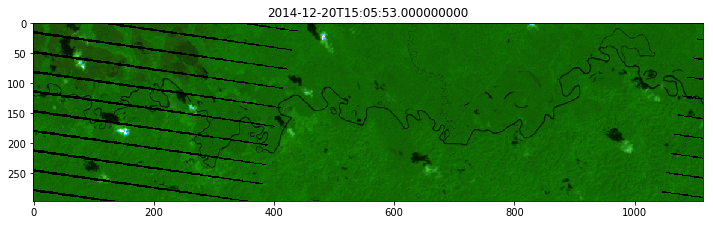

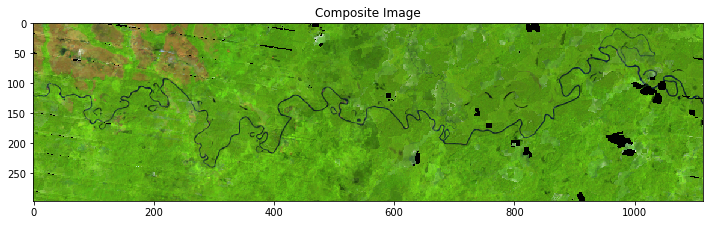

different


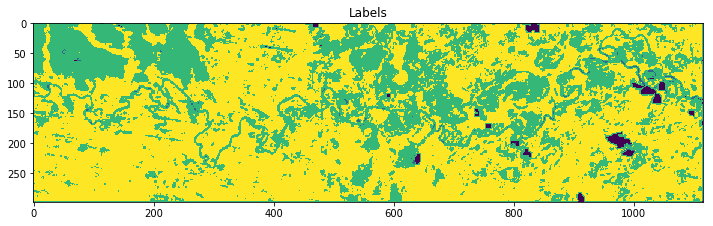

In [253]:
_,_,labs= C.plot_and_retrieve(style ='asdfasd')

## This is how we go about validating

In [284]:
def score(C,shape):
    [_,img_labels,_,imgClipped] = clip_from_shape(shape)
    img_pred = C.predict(imgClipped)
    return img_pred,img_labels

In [279]:
A2 = gpd.read_file('./train/train_311.shp')

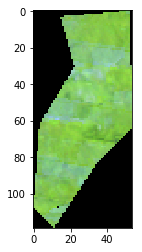

(119, 54)


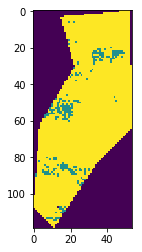

In [285]:
img_pred, img_labs = score(C,A2.geometry[0])

In [297]:
np.sum(img_pred == img_labs*2)/(img_pred.shape[0]*img_pred.shape[1])

0.9590725178960473

In [19]:
B = Columbia_Forest_Predictor(mode = 'load',filename = 'all_classes')

loading data!
Done Loading data
Beginning plotting


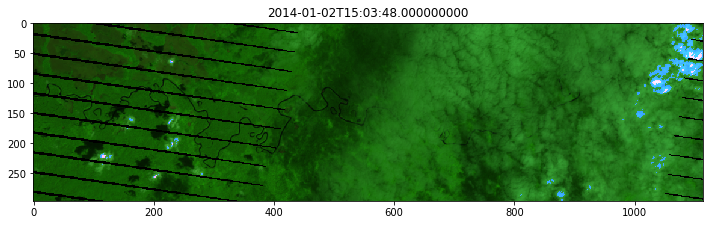

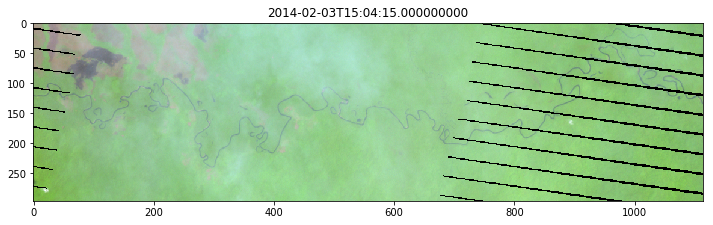

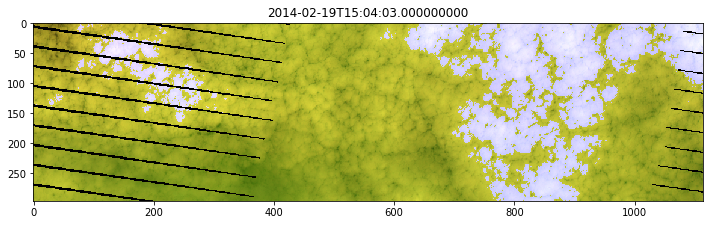

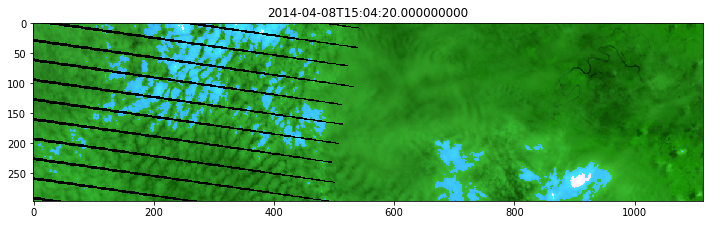

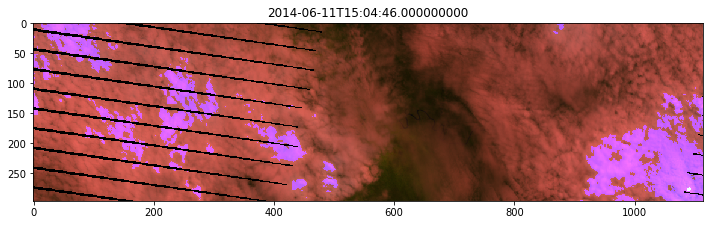

...

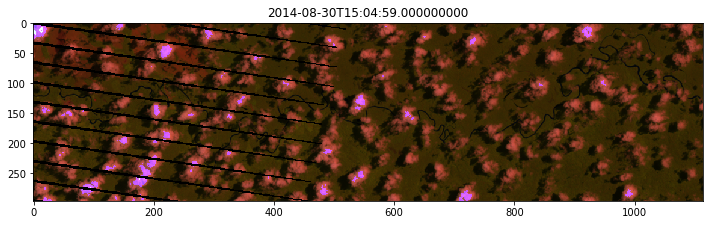

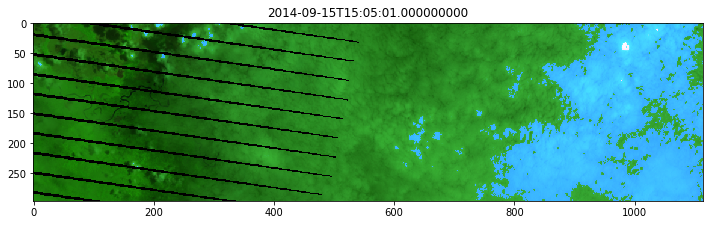

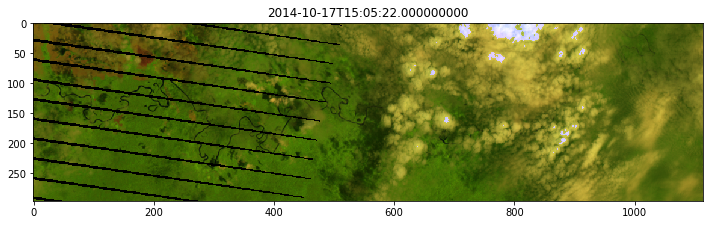

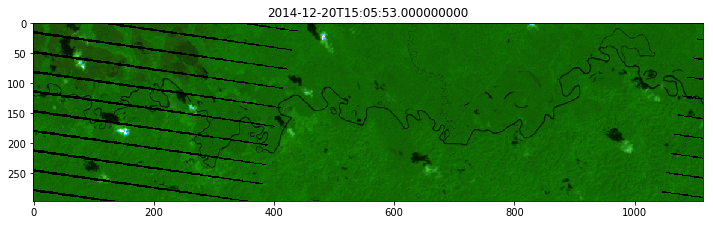

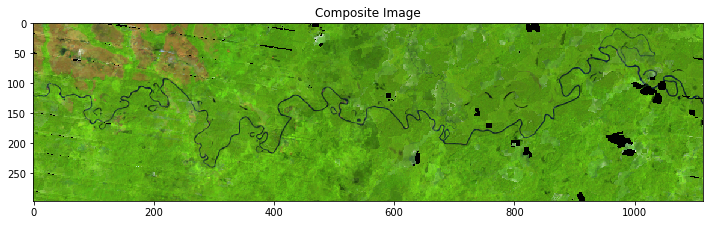

different


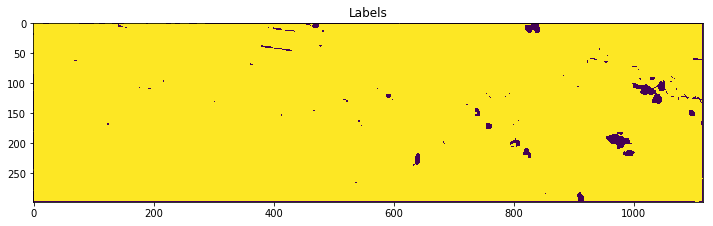

(<xarray.Dataset>
 Dimensions:    (latitude: 296, longitude: 1114, time: 10)
 Coordinates:
   * time       (time) datetime64[ns] 2014-01-02T15:03:48 2014-02-03T15:04:15 ...
   * latitude   (latitude) float64 1.73 1.73 1.729 1.729 1.729 1.729 1.728 ...
   * longitude  (longitude) float64 -73.7 -73.7 -73.7 -73.7 -73.7 -73.7 -73.7 ...
 Data variables:
     red        (time, latitude, longitude) int16 660 659 568 622 584 583 565 ...
     green      (time, latitude, longitude) int16 628 627 626 625 564 522 541 ...
     blue       (time, latitude, longitude) int16 382 399 415 377 338 337 354 ...
     nir        (time, latitude, longitude) int16 2387 2428 2310 2351 2153 ...
     swir1      (time, latitude, longitude) int16 2206 2135 2064 2064 2065 ...
     swir2      (time, latitude, longitude) int16 1050 950 899 950 975 975 ...
     pixel_qa   (time, latitude, longitude) int32 66 66 66 66 66 66 66 66 66 ...
 Attributes:
     crs:      EPSG:4326, array([[[0.07681634, 0.06577489, 0.0397379 ],


In [17]:
B.plot_and_retrieve(style = 'not-KMeans')

Future Work! 
   - Let's make a GUI! 
   - Also, we can make a web-app?( That would be pretty cool)

In [18]:
dc.list_products()

,name,description,lat,platform,time,format,product_type,sat_row,sat_path,orbit,lon,gsi,instrument,crs,resolution,tile_size,spatial_dimensions
id,,,,,,,,,,,,,,,,,
46,alos2_jjfast_scansar_tile,ALOS-2 PALSAR JJ-FAST mosaic tiles generated f...,NaN,ALOS_2,None,GeoTiff,tile,NaN,NaN,NaN,NaN,NaN,PALSAR,NaN,NaN,NaN,NaN
61,alos2_jjfast_scansar_tile_colombia,ALOS2 PALSAR JJFAST tile in DN format processe...,NaN,ALOS_2,None,NetCDF,tile,NaN,NaN,NaN,NaN,NaN,PALSAR,EPSG:4326,"[-0.0002666666667, 0.0002666666667]","[0.5333333334, 0.5333333334]","(latitude, longitude)"
50,alos2_palsar_colombia,ALOS2 PALSAR tile in DN format processed for t...,NaN,ALOS_2,None,NetCDF,gamma0,NaN,NaN,NaN,NaN,NaN,PALSAR,EPSG:4326,"[-0.0002666666667, 0.0002666666667]","[0.5333333334, 0.5333333334]","(latitude, longitude)"
51,alos2_palsar_kenya,ALOS2 PALSAR tile in DN format processed for t...,NaN,ALOS_2,None,NetCDF,gamma0,NaN,NaN,NaN,NaN,NaN,PALSAR,EPSG:4326,"[-0.0002666666667, 0.0002666666667]","[0.5333333334, 0.5333333334]","(latitude, longitude)"
48,alos2_palsar_tile,ALOS-2 PALSAR mosaic tiles generated for use i...,NaN,ALOS_2,None,GeoTiff,gamma0,NaN,NaN,NaN,NaN,NaN,PALSAR,NaN,NaN,NaN,NaN
52,alos2_palsar_vietnam,ALOS2 PALSAR tile in DN format processed for t...,NaN,ALOS_2,None,NetCDF,gamma0,NaN,NaN,NaN,NaN,NaN,PALSAR,EPSG:4326,"[-0.0002666666667, 0.0002666666667]","[0.5333333334, 0.5333333334]","(latitude, longitude)"
53,alos_palsar_colombia,ALOS PALSAR tile in DN format processed for th...,NaN,ALOS,None,NetCDF,gamma0,NaN,NaN,NaN,NaN,NaN,PALSAR,EPSG:4326,"[-0.0002666666667, 0.0002666666667]","[0.5333333334, 0.5333333334]","(latitude, longitude)"
54,alos_palsar_kenya,ALOS PALSAR tile in DN format processed for th...,NaN,ALOS,None,NetCDF,gamma0,NaN,NaN,NaN,NaN,NaN,PALSAR,EPSG:4326,"[-0.0002666666667, 0.0002666666667]","[0.5333333334, 0.5333333334]","(latitude, longitude)"
47,alos_palsar_tile,ALOS PALSAR mosaic tiles generated for use in ...,NaN,ALOS,None,GeoTiff,gamma0,NaN,NaN,NaN,NaN,NaN,PALSAR,NaN,NaN,NaN,NaN


In [19]:
dc.load_data?

In [22]:
product = 'ls7_ledaps_sanagustin' 
measurements = ['swir']

In [47]:
a1[1:5]

(634469.0095568664, 240887.31807782815, 635561.6021397916, 241845.71555238296)

In [24]:
x=(1.65,1.73)
y=(-73.7,-73.4)
crs = 'EPSG:32618'

In [25]:
dataset = dc.load( product = product,x = x,y = y,crs = crs,measurements = measurements,  time = ('2012-01-01', '2015-01-01')) 


In [26]:
dataset

<xarray.Dataset>
Dimensions:  ()
Data variables:
    *empty*

In [28]:
img,minx1,maxx1,miny1,maxy1= binary_rasterize(A)

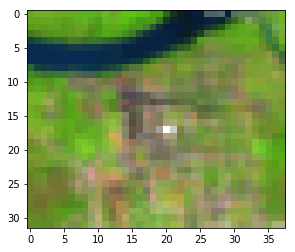

In [32]:
plt.imshow(get_map(minx1,miny1,maxx1,maxy1,coordinate_system='EPSG:32618'))

TypeError: Image data can not convert to float

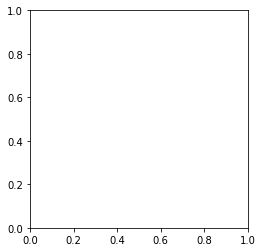

In [12]:
A.

In [2]:
xmin = minx1
xmax =maxx1
ymin = miny1
ymax = maxy1
product = "ls7_ledaps_sanagustin"
coordinate_system = 'epsg:4326'
time = None
measurements = ['red', 'green', 'blue', 'nir', 'swir1', 'swir2', 'pixel_qa']

NameError: name 'minx1' is not defined

In [ ]:
def get_map(xmin,
            xmax,
            ymin,
            ymax,
            product = "ls7_ledaps_sanagustin",
            coordinate_system = 'epsg:4326',time = None,
            measurements = ['red', 'green', 'blue', 'nir', 'swir1', 'swir2', 'pixel_qa']):
    
    dc = datacube.Datacube(app    = "my_random_app",
                       config = "/home/localuser/.datacube.conf")

#     xmin = coordinates[0]
#     xmax = coordinates[0]+size[0]
#     ymin = coordinates[1]
#     ymax = coordinates[1]+size[1]
    
    
#     projFrom = Proj(init = coordinate_system)     #The coordinate system used in the data
#     projTo = Proj(init = 'epsg:4326')    #WGS84

#     lonmin,latmin= coTran(projFrom,projTo,xmin,ymin)   #transform from epsg:... to WGS84

#     lonmax,latmax= coTran(projFrom,projTo,xmax,ymax)

#     latmean = np.average([latmin,latmax])
#     lonmean = np.average([lonmin,lonmax])
    dataset = dc.load( product = product,x = (xmin, xmax),y = (ymin, ymax),crs = coordinate_system,measurements = measurements,  time = ('2012-01-01', '2015-01-01')) 


    median_dataset = composite(dataset)
    img = np.dstack((median_dataset.swir1.values/np.nanmax(median_dataset.swir1.values),median_dataset.nir.values/np.nanmax(median_dataset.nir.values),median_dataset.red.values/np.nanmax(median_dataset.red.values)))
    img = np.nan_to_num(img,0)
    return img
    

In [35]:
dc = datacube.Datacube(app    = "my_random_app",config = "/home/localuser/.datacube.conf")
dc.load(product="ls7_ledaps_sanagustin", x=(xmin,xmax), y=(ymin,ymax), time=('2012-01-01', '2015-01-01'),
                output_crs=crs,measurements = measurements)

<xarray.Dataset>
Dimensions:  ()
Data variables:
    *empty*

In [1]:
from utils.data_cube_utilities import dc_water_classifier

In [4]:
import RasterClass

In [5]:
RasterClass.run_example()

AttributeError: 'Dataset' object has no attribute 'pixel_qa'